# Import Libraries

In [2]:
import numpy as np
import pandas as pd

# Loading the Data and Selecting the Features

### Import Data

In [3]:
loan_data_inputs_train = pd.read_csv('loan_data_inputs_train.csv', index_col = 0)
loan_data_targets_train = pd.read_csv('loan_data_targets_train.csv', index_col = 0, header = None)
loan_data_inputs_test = pd.read_csv('loan_data_inputs_test.csv', index_col = 0)
loan_data_targets_test = pd.read_csv('loan_data_targets_test.csv', index_col = 0, header = None)

/tmp/ipykernel_753463/3028036206.py:1: DtypeWarning: Columns (2,131,132,133,136,137,138,141) have mixed types. Specify dtype option on import or set low_memory=False.
  loan_data_inputs_train = pd.read_csv('loan_data_inputs_train.csv', index_col = 0)
/tmp/ipykernel_753463/3028036206.py:2: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  loan_data_targets_train = pd.read_csv('loan_data_targets_train.csv', index_col = 0, header = None)
/tmp/ipykernel_753463/3028036206.py:3: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  loan_data_inputs_test = pd.read_csv('loan_data_inputs_test.csv', index_col = 0)
/tmp/ipykernel_753463/3028036206.py:4: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  loan_data_targets_test = pd.read_csv('loan_data_targets_test.csv', index_col = 0, header = None)


### Explore Data

In [4]:
loan_data_inputs_train.head()

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,...,dti:25.6-30,dti:30-35,dti:>35,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
1800887,1800887,7052080,NaN,13000.0,13000.0,13000.0,36 months,14.33,446.40,C,...,0,0,0,1,0,0,0,0,0,0
1130140,1130140,35793918,NaN,1000.0,1000.0,1000.0,36 months,14.31,34.33,C,...,0,0,1,1,0,0,0,0,0,0
459855,459855,129181394,NaN,32000.0,32000.0,32000.0,60 months,16.01,778.35,C,...,0,0,0,1,0,0,0,0,0,0
283070,283070,48525958,NaN,21000.0,21000.0,21000.0,36 months,6.39,642.58,A,...,0,0,0,1,0,0,0,0,0,0
1785392,1785392,7711435,NaN,12000.0,12000.0,11975.0,36 months,12.99,404.27,B,...,0,0,0,0,0,0,0,1,0,0


In [5]:
loan_data_targets_train.head()

,1
0,
NaN,good_bad
1800887.0,1
1130140.0,1
459855.0,1
283070.0,1


In [6]:
loan_data_inputs_train.shape

(1808560, 392)

In [7]:
loan_data_targets_train.shape

(1808561, 1)

In [8]:
loan_data_inputs_test.shape

(452141, 392)

In [9]:
loan_data_targets_test.shape

(452142, 1)

In [10]:
loan_data_targets_test.tail()

,1
0,
1205942.0,1
860827.0,1
267134.0,1
867240.0,1
1123633.0,1


In [11]:
loan_data_inputs_test.tail()

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,...,dti:25.6-30,dti:30-35,dti:>35,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
1205942,1205942,25246506,NaN,35000.0,35000.0,35000.0,60 months,20.99,946.68,E,...,1,0,0,1,0,0,0,0,0,0
860827,860827,136576732,NaN,35000.0,35000.0,35000.0,36 months,7.21,1084.07,A,...,0,0,0,1,0,0,0,0,0,0
267134,267134,50456025,NaN,24000.0,24000.0,23975.0,36 months,9.99,774.30,B,...,0,0,0,1,0,0,0,0,0,0
867240,867240,136391664,NaN,10000.0,10000.0,10000.0,36 months,6.11,304.72,A,...,1,0,0,1,0,0,0,0,0,0
1123633,1123633,36231484,NaN,25000.0,25000.0,25000.0,36 months,6.49,766.12,A,...,0,0,0,1,0,0,0,0,0,0


In [12]:
# Find extra indices in targets
extra_train_idx = loan_data_targets_train.index.difference(
    loan_data_inputs_train.index
)

extra_test_idx = loan_data_targets_test.index.difference(
    loan_data_inputs_test.index
)

extra_train_idx, extra_test_idx


(Float64Index([nan], dtype='float64'), Float64Index([nan], dtype='float64'))

In [13]:
loan_data_targets_train = loan_data_targets_train.drop(extra_train_idx)
loan_data_targets_test  = loan_data_targets_test.drop(extra_test_idx)


In [14]:
print(loan_data_inputs_train.shape)
print(loan_data_targets_train.shape)

print(loan_data_inputs_test.shape)
print(loan_data_targets_test.shape)


(1808560, 392)
(1808560, 1)
(452141, 392)
(452141, 1)


In [15]:
for i in loan_data_inputs_train.columns:
    print(i)

Unnamed: 0
id
member_id
loan_amnt
funded_amnt
funded_amnt_inv
term
int_rate
installment
grade
sub_grade
emp_title
emp_length
home_ownership
annual_inc
verification_status
issue_d
loan_status
pymnt_plan
url
desc
purpose
title
zip_code
addr_state
dti
delinq_2yrs
earliest_cr_line
fico_range_low
fico_range_high
inq_last_6mths
mths_since_last_delinq
mths_since_last_record
open_acc
pub_rec
revol_bal
revol_util
total_acc
initial_list_status
out_prncp
out_prncp_inv
total_pymnt
total_pymnt_inv
total_rec_prncp
total_rec_int
total_rec_late_fee
recoveries
collection_recovery_fee
last_pymnt_d
last_pymnt_amnt
next_pymnt_d
last_credit_pull_d
last_fico_range_high
last_fico_range_low
collections_12_mths_ex_med
mths_since_last_major_derog
policy_code
application_type
annual_inc_joint
dti_joint
verification_status_joint
acc_now_delinq
tot_coll_amt
tot_cur_bal
open_acc_6m
open_act_il
open_il_12m
open_il_24m
mths_since_rcnt_il
total_bal_il
il_util
open_rv_12m
open_rv_24m
max_bal_bc
all_util
total_rev_hi_li

### Selecting the Features

In [16]:
inputs_train_with_ref_cat = loan_data_inputs_train.loc[:, [

    # =========================
    # GRADE
    # =========================
    'grade:A',
    'grade:B',
    'grade:C',
    'grade:D',
    'grade:E',
    'grade:F',
    'grade:G',

    # =========================
    # HOME OWNERSHIP
    # =========================
    'home_ownership:RENT_OTHER_NONE_ANY',
    'home_ownership:MORTGAGE',
    'home_ownership:OWN',

    # =========================
    # ADDR_STATE (your grouped states)
    # =========================
    'addr_state:IA_AL_AR_MS_OK_LA_NV',
    'addr_state:HI_NM_SD_FL',
    'addr_state:MO_MD_NC_NJ_TN_IN',
    'addr_state:PA_VA_MI_MN_KY_OH_AZ_NE',
    'addr_state:AK_DE_UT_MA_WI_GA_RI',
    'addr_state:IL_WY_MT',
    'addr_state:ND_KS_WA_CT_SC_CO',
    'addr_state:WV_DC_OR_NH_ID_VT_ME',
    'addr_state:CA',
    'addr_state:NY',
    'addr_state:TX',

    # =========================
    # VERIFICATION STATUS
    # =========================
    'verification_status:Not Verified',
    'verification_status:Source Verified',
    'verification_status:Verified',

    # =========================
    # PURPOSE (grouped)
    # =========================
    'purpose:educ_sm_b_ren_en_mov',
    'purpose:debt_cons_med_other',
    'purpose:vac_house_wed_major_purch_car_home_impr',

    # =========================
    # INITIAL LIST STATUS
    # =========================
    'initial_list_status:f',
    'initial_list_status:w',

    # =========================
    # TERM
    # =========================
    'term:36',
    'term:60',

    # =========================
    # EMP LENGTH
    # =========================
    'emp_length:0',
    'emp_length:1',
    'emp_length:2-6',
    'emp_length:7-9',
    'emp_length:10',

    # =========================
    # MTHS SINCE ISSUE D
    # =========================
    'mths_since_issue_d:85-88',
    'mths_since_issue_d:88-91',
    'mths_since_issue_d:91-93',
    'mths_since_issue_d:93-102',
    'mths_since_issue_d:102-113',
    'mths_since_issue_d:113-165',
    'mths_since_issue_d:>165',

    # =========================
    # INT RATE
    # =========================
    'int_rate:<=7.878',
    'int_rate:7.878-11.987',
    'int_rate:11.987-22.772',
    'int_rate:>22.772',

    # =========================
    # MTHS SINCE EARLIEST CR LINE
    # =========================
    'mths_since_earliest_cr_line:<=267',
    'mths_since_earliest_cr_line:267-557',
    'mths_since_earliest_cr_line:>557',

    # =========================
    # DELINQ 2 YRS
    # =========================
    'delinq_2yrs:0',
    'delinq_2yrs:1-3',
    'delinq_2yrs:>=4',

    # =========================
    # INQ LAST 6 MONTHS
    # =========================
    'inq_last_6mths:0',
    'inq_last_6mths:1-2',
    'inq_last_6mths:3-6',
    'inq_last_6mths:>6',

    # =========================
    # OPEN ACC
    # =========================
    'open_acc:0',
    'open_acc:1-3',
    'open_acc:4-12',
    'open_acc:13-17',
    'open_acc:18-22',
    'open_acc:23-25',
    'open_acc:26-30',
    'open_acc:>=31',

    # =========================
    # PUB REC
    # =========================
    'pub_rec:0-2',
    'pub_rec:3-4',
    'pub_rec:>=5',

    # =========================
    # TOTAL ACC
    # =========================
    'total_acc:<=27',
    'total_acc:28-51',
    'total_acc:>=52',

    # =========================
    # ACC NOW DELINQ
    # =========================
    'acc_now_delinq:0',
    'acc_now_delinq:>=1',

    # =========================
    # TOTAL REV HI LIM
    # =========================
    'total_rev_hi_lim:<=5K',
    'total_rev_hi_lim:5K-10K',
    'total_rev_hi_lim:10K-20K',
    'total_rev_hi_lim:20K-30K',
    'total_rev_hi_lim:30K-40K',
    'total_rev_hi_lim:40K-55K',
    'total_rev_hi_lim:55K-95K',
    'total_rev_hi_lim:>95K',

    # =========================
    # ANNUAL INC
    # =========================
    'annual_inc:<20K',
    'annual_inc:20K-30K',
    'annual_inc:30K-40K',
    'annual_inc:40K-50K',
    'annual_inc:50K-60K',
    'annual_inc:60K-70K',
    'annual_inc:70K-80K',
    'annual_inc:80K-90K',
    'annual_inc:90K-100K',
    'annual_inc:100K-120K',
    'annual_inc:120K-140K',
    'annual_inc:>140K',

    # =========================
    # DTI
    # =========================
    'dti:<=2',
    'dti:2-4',
    'dti:4-8',
    'dti:8-12.4',
    'dti:12.4-16.8',
    'dti:16.8-21.2',
    'dti:21.2-25.6',
    'dti:25.6-30',
    'dti:30-35',
    'dti:>35',

    # =========================
    # MTHS SINCE LAST DELINQ
    # =========================
    'mths_since_last_delinq:Missing',
    'mths_since_last_delinq:0-10',
    'mths_since_last_delinq:10-30',
    'mths_since_last_delinq:30-70',
    'mths_since_last_delinq:>=70',

    # =========================
    # MTHS SINCE LAST RECORD
    # =========================
    'mths_since_last_record:Missing',
    'mths_since_last_record:0-2',
    'mths_since_last_record:3-20',
    'mths_since_last_record:21-31',
    'mths_since_last_record:32-80',
    'mths_since_last_record:81-86',
    'mths_since_last_record:>=86'
]]


In [17]:
inputs_train_with_ref_cat

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,home_ownership:RENT_OTHER_NONE_ANY,home_ownership:MORTGAGE,home_ownership:OWN,...,mths_since_last_delinq:10-30,mths_since_last_delinq:30-70,mths_since_last_delinq:>=70,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
1800887,0,0,1,0,0,0,0,0,1,0,...,0,1,0,1,0,0,0,0,0,0
1130140,0,0,1,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
459855,0,0,1,0,0,0,0,0,1,0,...,0,0,1,1,0,0,0,0,0,0
283070,1,0,0,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
1785392,0,1,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
732180,0,0,1,0,0,0,0,1,0,0,...,1,0,0,1,0,0,0,0,0,0
110268,1,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
1692743,0,1,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
2229084,0,0,1,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0


In [18]:
inputs_train_with_ref_cat.shape

(1808560, 115)

In [19]:
ref_categories = [

    # =========================
    # GRADE
    # =========================
    'grade:G',

    # =========================
    # HOME OWNERSHIP
    # =========================
    'home_ownership:RENT_OTHER_NONE_ANY',

    # =========================
    # ADDR_STATE
    # =========================
    'addr_state:WV_DC_OR_NH_ID_VT_ME',

    # =========================
    # VERIFICATION STATUS
    # =========================
    'verification_status:Verified',

    # =========================
    # PURPOSE
    # =========================
    'purpose:debt_cons_med_other',

    # =========================
    # INITIAL LIST STATUS
    # =========================
    'initial_list_status:w',

    # =========================
    # TERM
    # =========================
    'term:60',

    # =========================
    # EMP LENGTH
    # =========================
    'emp_length:0',

    # =========================
    # MTHS SINCE ISSUE D
    # =========================
    'mths_since_issue_d:>165',

    # =========================
    # INT RATE
    # =========================
    'int_rate:>22.772',

    # =========================
    # MTHS SINCE EARLIEST CR LINE
    # =========================
    'mths_since_earliest_cr_line:>557',

    # =========================
    # DELINQ 2 YRS
    # =========================
    'delinq_2yrs:>=4',

    # =========================
    # INQ LAST 6 MONTHS
    # =========================
    'inq_last_6mths:>6',

    # =========================
    # OPEN ACC
    # =========================
    'open_acc:>=31',

    # =========================
    # PUB REC
    # =========================
    'pub_rec:>=5',

    # =========================
    # TOTAL ACC
    # =========================
    'total_acc:>=52',

    # =========================
    # ACC NOW DELINQ
    # =========================
    'acc_now_delinq:>=1',

    # =========================
    # TOTAL REV HI LIM
    # =========================
    'total_rev_hi_lim:>95K',

    # =========================
    # ANNUAL INC
    # =========================
    'annual_inc:>140K',

    # =========================
    # DTI
    # =========================
    'dti:>35',

    # =========================
    # MTHS SINCE LAST DELINQ
    # =========================
    'mths_since_last_delinq:>=70',

    # =========================
    # MTHS SINCE LAST RECORD
    # =========================
    'mths_since_last_record:>=86'
]


In [20]:
inputs_train = inputs_train_with_ref_cat.drop(ref_categories, axis = 1)
inputs_train.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:MORTGAGE,home_ownership:OWN,addr_state:IA_AL_AR_MS_OK_LA_NV,addr_state:HI_NM_SD_FL,...,mths_since_last_delinq:Missing,mths_since_last_delinq:0-10,mths_since_last_delinq:10-30,mths_since_last_delinq:30-70,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86
1800887,0,0,1,0,0,0,1,0,0,0,...,0,0,0,1,1,0,0,0,0,0
1130140,0,0,1,0,0,0,1,0,0,0,...,1,0,0,0,1,0,0,0,0,0
459855,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
283070,1,0,0,0,0,0,1,0,0,0,...,1,0,0,0,1,0,0,0,0,0
1785392,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [21]:
a = inputs_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1808560 entries, 1800887 to 2219110
Data columns (total 93 columns):
 #   Column                                           Dtype
---  ------                                           -----
 0   grade:A                                          int64
 1   grade:B                                          int64
 2   grade:C                                          int64
 3   grade:D                                          int64
 4   grade:E                                          int64
 5   grade:F                                          int64
 6   home_ownership:MORTGAGE                          int64
 7   home_ownership:OWN                               int64
 8   addr_state:IA_AL_AR_MS_OK_LA_NV                  int64
 9   addr_state:HI_NM_SD_FL                           int64
 10  addr_state:MO_MD_NC_NJ_TN_IN                     int64
 11  addr_state:PA_VA_MI_MN_KY_OH_AZ_NE               int64
 12  addr_state:AK_DE_UT_MA_WI_GA_RI     

In [22]:
loan_data_targets_train = loan_data_targets_train.astype(int).values.ravel()


In [23]:
loan_data_targets_train

array([1, 1, 1, ..., 1, 0, 1])

In [24]:
type(loan_data_targets_test)


pandas.core.frame.DataFrame

In [25]:
loan_data_targets_test = loan_data_targets_test.iloc[:, 0]



In [26]:
loan_data_targets_test = (
    loan_data_targets_test
    .astype(str)
    .str.strip()
    .replace({'0': 0, '1': 1})
    .astype(int)
)


In [27]:
print(type(loan_data_targets_test))
print(loan_data_targets_test.dtype)
print(loan_data_targets_test.unique())


<class 'pandas.core.series.Series'>
int64
[1 0]


# PD Model Estimation

## Logistic Regression

In [28]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

In [29]:
reg = LogisticRegression()

In [30]:
pd.options.display.max_rows = None

In [31]:
reg.fit(inputs_train, loan_data_targets_train)

LogisticRegression()

In [32]:
reg.intercept_

array([0.39267764])

In [33]:
reg.coef_

array([[ 1.46501045e+00,  1.07553544e+00,  7.06472306e-01,
         3.42713544e-01,  1.11314348e-01, -2.54270469e-02,
         2.47065128e-01,  1.10318060e-01, -4.87479734e-01,
        -4.00369190e-01, -3.78972100e-01, -3.21593414e-01,
        -2.55655125e-01, -1.40636597e-01, -7.15259084e-02,
        -3.61858292e-01, -4.08000588e-01, -3.55376934e-01,
         2.18595247e-01,  3.20763666e-02, -1.94732167e-01,
         1.13252662e-02,  1.69370537e-02,  1.86277537e-01,
         9.68179499e-02,  1.07998164e-01,  8.45231397e-02,
         1.34190030e-01,  3.09222724e+00,  2.00331904e+00,
         1.26636953e+00,  6.85883614e-01,  1.92680905e-01,
        -1.30770551e-01,  7.70156401e-01,  3.17633024e-01,
         1.92845997e-01,  2.25559222e-02,  8.11819535e-02,
         1.11354511e-02,  2.97721753e-04,  3.67085444e-01,
         1.95546264e-01,  4.47495178e-02,  1.03865521e-02,
         2.53394925e-01,  1.65312882e-01,  7.77360401e-02,
         3.55753039e-02,  1.35025602e-02, -3.00268107e-0

In [34]:
feature_name = inputs_train.columns.values

In [35]:
summary_table = pd.DataFrame(columns = ['Feature name'], data = feature_name)
summary_table['Coefficients'] = np.transpose(reg.coef_)
summary_table.index = summary_table.index + 1
summary_table.loc[0] = ['Intercept', reg.intercept_[0]]
summary_table = summary_table.sort_index()
summary_table

,Feature name,Coefficients
0,Intercept,0.392678
1,grade:A,1.465010
2,grade:B,1.075535
3,grade:C,0.706472
4,grade:D,0.342714
5,grade:E,0.111314
6,grade:F,-0.025427
7,home_ownership:MORTGAGE,0.247065
8,home_ownership:OWN,0.110318
9,addr_state:IA_AL_AR_MS_OK_LA_NV,-0.487480


## Build a Logistic Regression Model with P-Values

In [36]:
from sklearn import linear_model
import scipy.stats as stat

class LogisticRegression_with_p_values:
    
    def __init__(self, *args, **kwargs):
        self.model = linear_model.LogisticRegression(*args, **kwargs)

    def fit(self, X, y):
        self.model.fit(X, y)

        # Fisher Information Matrix
        denom = (2.0 * (1.0 + np.cosh(self.model.decision_function(X))))
        denom = np.tile(denom, (X.shape[1], 1)).T
        F_ij = np.dot((X / denom).T, X)

        Cramer_Rao = np.linalg.inv(F_ij)
        sigma_estimates = np.sqrt(np.diagonal(Cramer_Rao))

        z_scores = self.model.coef_[0] / sigma_estimates
        p_values = [stat.norm.sf(abs(x)) * 2 for x in z_scores]

        self.coef_ = self.model.coef_
        self.intercept_ = self.model.intercept_
        self.p_values = p_values


In [37]:
# inputs_train already has reference categories removed
X = inputs_train
y = loan_data_targets_train


In [38]:
feature_name = inputs_train.columns.tolist()

In [39]:
reg = LogisticRegression_with_p_values(
    solver='lbfgs',
    max_iter=1000,
    n_jobs=-1
)

reg.fit(X, y)

In [40]:
summary_table = pd.DataFrame({
    'Feature name': feature_name,
    'Coefficients': reg.coef_[0]
})


In [41]:
summary_table

,Feature name,Coefficients
0,grade:A,1.465010
1,grade:B,1.075535
2,grade:C,0.706472
3,grade:D,0.342714
4,grade:E,0.111314
5,grade:F,-0.025427
6,home_ownership:MORTGAGE,0.247065
7,home_ownership:OWN,0.110318
8,addr_state:IA_AL_AR_MS_OK_LA_NV,-0.487480
9,addr_state:HI_NM_SD_FL,-0.400369


In [42]:
# build summary table from FINAL feature list
summary_table = pd.DataFrame(
    columns=['Feature name'],
    data=feature_name
)

# assign coefficients (aligned by position, not index magic)
summary_table['Coefficients'] = reg.coef_[0]

# shift index to start from 1
summary_table.index = summary_table.index + 1

# insert intercept at index 0
summary_table.loc[0] = ['Intercept', reg.intercept_[0]]

# sort to keep intercept on top
summary_table = summary_table.sort_index()

summary_table


,Feature name,Coefficients
0,Intercept,0.392678
1,grade:A,1.465010
2,grade:B,1.075535
3,grade:C,0.706472
4,grade:D,0.342714
5,grade:E,0.111314
6,grade:F,-0.025427
7,home_ownership:MORTGAGE,0.247065
8,home_ownership:OWN,0.110318
9,addr_state:IA_AL_AR_MS_OK_LA_NV,-0.487480


In [43]:
p_values = reg.p_values

# prepend NaN for intercept
p_values = np.insert(p_values, 0, np.nan)

# assign to summary table
summary_table['p_values'] = p_values

summary_table

,Feature name,Coefficients,p_values
0,Intercept,0.392678,NaN
1,grade:A,1.465010,0.000000e+00
2,grade:B,1.075535,6.449941e-302
3,grade:C,0.706472,1.824754e-155
4,grade:D,0.342714,6.231206e-38
5,grade:E,0.111314,8.186413e-06
6,grade:F,-0.025427,2.984133e-01
7,home_ownership:MORTGAGE,0.247065,0.000000e+00
8,home_ownership:OWN,0.110318,1.203067e-43
9,addr_state:IA_AL_AR_MS_OK_LA_NV,-0.487480,4.281286e-164


In [44]:
alpha = 0.05

# select non-significant variables (exclude Intercept automatically)
non_significant_features = summary_table[
    (summary_table['p_values'] > alpha)
].copy()

non_significant_features

,Feature name,Coefficients,p_values
6,grade:F,-0.025427,0.298413
22,purpose:vac_house_wed_major_purch_car_home_impr,0.011325,0.148511
38,mths_since_earliest_cr_line:<=267,0.022556,0.190829
40,delinq_2yrs:0,0.011135,0.602483
41,delinq_2yrs:1-3,0.000298,0.987859
44,inq_last_6mths:3-6,0.044750,0.511274
45,open_acc:0,0.010387,0.971184
49,open_acc:18-22,0.035575,0.196298
50,open_acc:23-25,0.013503,0.654033
51,open_acc:26-30,-0.030027,0.337030


In [45]:
inputs_train_with_ref_cat = loan_data_inputs_train.loc[:, [

    # =========================
    # GRADE
    # =========================
    'grade:A',
    'grade:B',
    'grade:C',
    'grade:D',
    'grade:E',
    'grade:F',
    'grade:G',

    # =========================
    # HOME OWNERSHIP
    # =========================
    'home_ownership:RENT_OTHER_NONE_ANY',
    'home_ownership:MORTGAGE',
    'home_ownership:OWN',

    # =========================
    # ADDR_STATE
    # =========================
    'addr_state:IA_AL_AR_MS_OK_LA_NV',
    'addr_state:HI_NM_SD_FL',
    'addr_state:MO_MD_NC_NJ_TN_IN',
    'addr_state:PA_VA_MI_MN_KY_OH_AZ_NE',
    'addr_state:AK_DE_UT_MA_WI_GA_RI',
    'addr_state:IL_WY_MT',
    'addr_state:ND_KS_WA_CT_SC_CO',
    'addr_state:WV_DC_OR_NH_ID_VT_ME',
    'addr_state:CA',
    'addr_state:NY',
    'addr_state:TX',

    # =========================
    # VERIFICATION STATUS
    # =========================
    'verification_status:Not Verified',
    'verification_status:Source Verified',
    'verification_status:Verified',

    # =========================
    # PURPOSE
    # =========================
    'purpose:educ_sm_b_ren_en_mov',
    'purpose:debt_cons_med_other',
    'purpose:vac_house_wed_major_purch_car_home_impr',

    # =========================
    # INITIAL LIST STATUS
    # =========================
    'initial_list_status:f',
    'initial_list_status:w',

    # =========================
    # TERM
    # =========================
    'term:36',
    'term:60',

    # =========================
    # EMP LENGTH
    # =========================
    'emp_length:0',
    'emp_length:1',
    'emp_length:2-6',
    'emp_length:7-9',
    'emp_length:10',

    # =========================
    # MTHS SINCE ISSUE D
    # =========================
    'mths_since_issue_d:85-88',
    'mths_since_issue_d:88-91',
    'mths_since_issue_d:91-93',
    'mths_since_issue_d:93-102',
    'mths_since_issue_d:102-113',
    'mths_since_issue_d:113-165',
    'mths_since_issue_d:>165',

    # =========================
    # INT RATE
    # =========================
    'int_rate:<=7.878',
    'int_rate:7.878-11.987',
    'int_rate:11.987-22.772',
    'int_rate:>22.772',

    # =========================
    # MTHS SINCE EARLIEST CR LINE
    # =========================
    'mths_since_earliest_cr_line:<=267',
    'mths_since_earliest_cr_line:267-557',
    'mths_since_earliest_cr_line:>557',

    # =========================
    # INQ LAST 6 MONTHS
    # =========================
    'inq_last_6mths:0',
    'inq_last_6mths:1-2',
    'inq_last_6mths:3-6',
    'inq_last_6mths:>6',

    # =========================
    # OPEN ACC
    # =========================
    'open_acc:0',
    'open_acc:1-3',
    'open_acc:4-12',
    'open_acc:13-17',
    'open_acc:18-22',
    'open_acc:23-25',
    'open_acc:26-30',
    'open_acc:>=31',

    # =========================
    # ACC NOW DELINQ
    # =========================
    'acc_now_delinq:0',
    'acc_now_delinq:>=1',

    # =========================
    # TOTAL REV HI LIM
    # =========================
    'total_rev_hi_lim:<=5K',
    'total_rev_hi_lim:5K-10K',
    'total_rev_hi_lim:10K-20K',
    'total_rev_hi_lim:20K-30K',
    'total_rev_hi_lim:30K-40K',
    'total_rev_hi_lim:40K-55K',
    'total_rev_hi_lim:55K-95K',
    'total_rev_hi_lim:>95K',

    # =========================
    # ANNUAL INC
    # =========================
    'annual_inc:<20K',
    'annual_inc:20K-30K',
    'annual_inc:30K-40K',
    'annual_inc:40K-50K',
    'annual_inc:50K-60K',
    'annual_inc:60K-70K',
    'annual_inc:70K-80K',
    'annual_inc:80K-90K',
    'annual_inc:90K-100K',
    'annual_inc:100K-120K',
    'annual_inc:120K-140K',
    'annual_inc:>140K',

    # =========================
    # DTI
    # =========================
    'dti:<=2',
    'dti:2-4',
    'dti:4-8',
    'dti:8-12.4',
    'dti:12.4-16.8',
    'dti:16.8-21.2',
    'dti:21.2-25.6',
    'dti:25.6-30',
    'dti:30-35',
    'dti:>35',

    # =========================
    # MTHS SINCE LAST DELINQ
    # =========================
    'mths_since_last_delinq:Missing',
    'mths_since_last_delinq:0-10',
    'mths_since_last_delinq:10-30',
    'mths_since_last_delinq:30-70',
    'mths_since_last_delinq:>=70',

    # =========================
    # MTHS SINCE LAST RECORD
    # =========================
    'mths_since_last_record:Missing',
    'mths_since_last_record:0-2',
    'mths_since_last_record:3-20',
    'mths_since_last_record:21-31',
    'mths_since_last_record:32-80',
    'mths_since_last_record:81-86',
    'mths_since_last_record:>=86'
]]


In [46]:
ref_categories = [

    # =========================
    # GRADE
    # =========================
    'grade:G',

    # =========================
    # HOME OWNERSHIP
    # =========================
    'home_ownership:RENT_OTHER_NONE_ANY',

    # =========================
    # ADDR_STATE
    # =========================
    'addr_state:WV_DC_OR_NH_ID_VT_ME',

    # =========================
    # VERIFICATION STATUS
    # =========================
    'verification_status:Verified',

    # =========================
    # PURPOSE
    # =========================
    'purpose:debt_cons_med_other',

    # =========================
    # INITIAL LIST STATUS
    # =========================
    'initial_list_status:w',

    # =========================
    # TERM
    # =========================
    'term:60',

    # =========================
    # EMP LENGTH
    # =========================
    'emp_length:0',

    # =========================
    # MTHS SINCE ISSUE D
    # =========================
    'mths_since_issue_d:>165',

    # =========================
    # INT RATE
    # =========================
    'int_rate:>22.772',

    # =========================
    # MTHS SINCE EARLIEST CR LINE
    # =========================
    'mths_since_earliest_cr_line:>557',

    # =========================
    # INQ LAST 6 MONTHS
    # =========================
    'inq_last_6mths:>6',

    # =========================
    # OPEN ACC
    # =========================
    'open_acc:>=31',

    # =========================
    # ACC NOW DELINQ
    # =========================
    'acc_now_delinq:>=1',

    # =========================
    # TOTAL REV HI LIM
    # =========================
    'total_rev_hi_lim:>95K',

    # =========================
    # ANNUAL INC
    # =========================
    'annual_inc:>140K',

    # =========================
    # DTI
    # =========================
    'dti:>35',

    # =========================
    # MTHS SINCE LAST DELINQ
    # =========================
    'mths_since_last_delinq:>=70',

    # =========================
    # MTHS SINCE LAST RECORD
    # =========================
    'mths_since_last_record:>=86'
]


In [47]:
inputs_train = inputs_train_with_ref_cat.drop(ref_categories, axis = 1)
inputs_train.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:MORTGAGE,home_ownership:OWN,addr_state:IA_AL_AR_MS_OK_LA_NV,addr_state:HI_NM_SD_FL,...,mths_since_last_delinq:Missing,mths_since_last_delinq:0-10,mths_since_last_delinq:10-30,mths_since_last_delinq:30-70,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86
1800887,0,0,1,0,0,0,1,0,0,0,...,0,0,0,1,1,0,0,0,0,0
1130140,0,0,1,0,0,0,1,0,0,0,...,1,0,0,0,1,0,0,0,0,0
459855,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
283070,1,0,0,0,0,0,1,0,0,0,...,1,0,0,0,1,0,0,0,0,0
1785392,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [48]:
reg2 = LogisticRegression_with_p_values()
reg2.fit(inputs_train, loan_data_targets_train)

In [49]:
feature_name = inputs_train.columns.values

In [50]:
summary_table = pd.DataFrame(columns = ['Feature name'], data = feature_name)
summary_table['Coefficients'] = np.transpose(reg2.coef_)
summary_table.index = summary_table.index + 1
summary_table.loc[0] = ['Intercept', reg2.intercept_[0]]
summary_table = summary_table.sort_index()
summary_table

,Feature name,Coefficients
0,Intercept,0.435466
1,grade:A,1.521062
2,grade:B,1.112401
3,grade:C,0.753321
4,grade:D,0.388298
5,grade:E,0.151061
6,grade:F,0.014016
7,home_ownership:MORTGAGE,0.247993
8,home_ownership:OWN,0.106374
9,addr_state:IA_AL_AR_MS_OK_LA_NV,-0.509384


In [51]:
p_values = reg2.p_values
p_values = np.append(np.nan, np.array(p_values))
summary_table['p_values'] = p_values
summary_table

,Feature name,Coefficients,p_values
0,Intercept,0.435466,NaN
1,grade:A,1.521062,0.000000e+00
2,grade:B,1.112401,0.000000e+00
3,grade:C,0.753321,2.416148e-177
4,grade:D,0.388298,2.019759e-48
5,grade:E,0.151061,1.297246e-09
6,grade:F,0.014016,5.652711e-01
7,home_ownership:MORTGAGE,0.247993,0.000000e+00
8,home_ownership:OWN,0.106374,8.858523e-41
9,addr_state:IA_AL_AR_MS_OK_LA_NV,-0.509384,1.416028e-176


In [52]:
import pickle

In [53]:
pickle.dump(reg2, open('pd_model.sav', 'wb'))

# PD Model Validation (Test)

### Out-of-sample validation (test)

In [54]:
inputs_test_with_ref_cat = loan_data_inputs_test.loc[: , [
    # =========================
    # GRADE
    # =========================
    'grade:A',
    'grade:B',
    'grade:C',
    'grade:D',
    'grade:E',
    'grade:F',
    'grade:G',

    # =========================
    # HOME OWNERSHIP
    # =========================
    'home_ownership:RENT_OTHER_NONE_ANY',
    'home_ownership:MORTGAGE',
    'home_ownership:OWN',

    # =========================
    # ADDR_STATE
    # =========================
    'addr_state:IA_AL_AR_MS_OK_LA_NV',
    'addr_state:HI_NM_SD_FL',
    'addr_state:MO_MD_NC_NJ_TN_IN',
    'addr_state:PA_VA_MI_MN_KY_OH_AZ_NE',
    'addr_state:AK_DE_UT_MA_WI_GA_RI',
    'addr_state:IL_WY_MT',
    'addr_state:ND_KS_WA_CT_SC_CO',
    'addr_state:WV_DC_OR_NH_ID_VT_ME',
    'addr_state:CA',
    'addr_state:NY',
    'addr_state:TX',

    # =========================
    # VERIFICATION STATUS
    # =========================
    'verification_status:Not Verified',
    'verification_status:Source Verified',
    'verification_status:Verified',

    # =========================
    # PURPOSE
    # =========================
    'purpose:educ_sm_b_ren_en_mov',
    'purpose:debt_cons_med_other',
    'purpose:vac_house_wed_major_purch_car_home_impr',

    # =========================
    # INITIAL LIST STATUS
    # =========================
    'initial_list_status:f',
    'initial_list_status:w',

    # =========================
    # TERM
    # =========================
    'term:36',
    'term:60',

    # =========================
    # EMP LENGTH
    # =========================
    'emp_length:0',
    'emp_length:1',
    'emp_length:2-6',
    'emp_length:7-9',
    'emp_length:10',

    # =========================
    # MTHS SINCE ISSUE D
    # =========================
    'mths_since_issue_d:85-88',
    'mths_since_issue_d:88-91',
    'mths_since_issue_d:91-93',
    'mths_since_issue_d:93-102',
    'mths_since_issue_d:102-113',
    'mths_since_issue_d:113-165',
    'mths_since_issue_d:>165',

    # =========================
    # INT RATE
    # =========================
    'int_rate:<=7.878',
    'int_rate:7.878-11.987',
    'int_rate:11.987-22.772',
    'int_rate:>22.772',

    # =========================
    # MTHS SINCE EARLIEST CR LINE
    # =========================
    'mths_since_earliest_cr_line:<=267',
    'mths_since_earliest_cr_line:267-557',
    'mths_since_earliest_cr_line:>557',

    # =========================
    # INQ LAST 6 MONTHS
    # =========================
    'inq_last_6mths:0',
    'inq_last_6mths:1-2',
    'inq_last_6mths:3-6',
    'inq_last_6mths:>6',

    # =========================
    # OPEN ACC
    # =========================
    'open_acc:0',
    'open_acc:1-3',
    'open_acc:4-12',
    'open_acc:13-17',
    'open_acc:18-22',
    'open_acc:23-25',
    'open_acc:26-30',
    'open_acc:>=31',

    # =========================
    # ACC NOW DELINQ
    # =========================
    'acc_now_delinq:0',
    'acc_now_delinq:>=1',

    # =========================
    # TOTAL REV HI LIM
    # =========================
    'total_rev_hi_lim:<=5K',
    'total_rev_hi_lim:5K-10K',
    'total_rev_hi_lim:10K-20K',
    'total_rev_hi_lim:20K-30K',
    'total_rev_hi_lim:30K-40K',
    'total_rev_hi_lim:40K-55K',
    'total_rev_hi_lim:55K-95K',
    'total_rev_hi_lim:>95K',

    # =========================
    # ANNUAL INC
    # =========================
    'annual_inc:<20K',
    'annual_inc:20K-30K',
    'annual_inc:30K-40K',
    'annual_inc:40K-50K',
    'annual_inc:50K-60K',
    'annual_inc:60K-70K',
    'annual_inc:70K-80K',
    'annual_inc:80K-90K',
    'annual_inc:90K-100K',
    'annual_inc:100K-120K',
    'annual_inc:120K-140K',
    'annual_inc:>140K',

    # =========================
    # DTI
    # =========================
    'dti:<=2',
    'dti:2-4',
    'dti:4-8',
    'dti:8-12.4',
    'dti:12.4-16.8',
    'dti:16.8-21.2',
    'dti:21.2-25.6',
    'dti:25.6-30',
    'dti:30-35',
    'dti:>35',

    # =========================
    # MTHS SINCE LAST DELINQ
    # =========================
    'mths_since_last_delinq:Missing',
    'mths_since_last_delinq:0-10',
    'mths_since_last_delinq:10-30',
    'mths_since_last_delinq:30-70',
    'mths_since_last_delinq:>=70',

    # =========================
    # MTHS SINCE LAST RECORD
    # =========================
    'mths_since_last_record:Missing',
    'mths_since_last_record:0-2',
    'mths_since_last_record:3-20',
    'mths_since_last_record:21-31',
    'mths_since_last_record:32-80',
    'mths_since_last_record:81-86',
    'mths_since_last_record:>=86'
]]


In [55]:
ref_categories = [

    # =========================
    # GRADE
    # =========================
    'grade:G',

    # =========================
    # HOME OWNERSHIP
    # =========================
    'home_ownership:RENT_OTHER_NONE_ANY',

    # =========================
    # ADDR_STATE
    # =========================
    'addr_state:WV_DC_OR_NH_ID_VT_ME',

    # =========================
    # VERIFICATION STATUS
    # =========================
    'verification_status:Verified',

    # =========================
    # PURPOSE
    # =========================
    'purpose:debt_cons_med_other',

    # =========================
    # INITIAL LIST STATUS
    # =========================
    'initial_list_status:w',

    # =========================
    # TERM
    # =========================
    'term:60',

    # =========================
    # EMP LENGTH
    # =========================
    'emp_length:0',

    # =========================
    # MTHS SINCE ISSUE D
    # =========================
    'mths_since_issue_d:>165',

    # =========================
    # INT RATE
    # =========================
    'int_rate:>22.772',

    # =========================
    # MTHS SINCE EARLIEST CR LINE
    # =========================
    'mths_since_earliest_cr_line:>557',

    # =========================
    # INQ LAST 6 MONTHS
    # =========================
    'inq_last_6mths:>6',

    # =========================
    # OPEN ACC
    # =========================
    'open_acc:>=31',

    # =========================
    # ACC NOW DELINQ
    # =========================
    'acc_now_delinq:>=1',

    # =========================
    # TOTAL REV HI LIM
    # =========================
    'total_rev_hi_lim:>95K',

    # =========================
    # ANNUAL INC
    # =========================
    'annual_inc:>140K',

    # =========================
    # DTI
    # =========================
    'dti:>35',

    # =========================
    # MTHS SINCE LAST DELINQ
    # =========================
    'mths_since_last_delinq:>=70',

    # =========================
    # MTHS SINCE LAST RECORD
    # =========================
    'mths_since_last_record:>=86'
]


In [56]:
inputs_test = inputs_test_with_ref_cat.drop(ref_categories, axis = 1)
inputs_test.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:MORTGAGE,home_ownership:OWN,addr_state:IA_AL_AR_MS_OK_LA_NV,addr_state:HI_NM_SD_FL,...,mths_since_last_delinq:Missing,mths_since_last_delinq:0-10,mths_since_last_delinq:10-30,mths_since_last_delinq:30-70,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86
392949,0,1,0,0,0,0,1,0,0,0,...,1,0,0,0,1,0,0,0,0,0
1273506,0,0,1,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,0,0,0
324024,1,0,0,0,0,0,1,0,0,1,...,1,0,0,0,1,0,0,0,0,0
2066630,0,1,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
477199,0,0,0,0,1,0,0,1,0,0,...,0,0,0,1,1,0,0,0,0,0


In [57]:
y_hat_test = reg2.model.predict(inputs_test)

In [58]:
type(y_hat_test)

numpy.ndarray

In [59]:
y_hat_test[509]

1

In [60]:
loan_data_targets_test

0
392949.0     1
1273506.0    1
324024.0     1
2066630.0    1
477199.0     1
1975547.0    1
302723.0     1
1972188.0    1
2251549.0    1
641990.0     1
507598.0     1
394636.0     1
1198110.0    1
273124.0     1
710850.0     1
1966882.0    1
1987097.0    1
2129008.0    1
367120.0     0
1041857.0    1
628518.0     1
273432.0     1
1839550.0    1
1781031.0    0
613933.0     1
1536009.0    1
1882235.0    1
643490.0     1
1740335.0    1
1545080.0    1
1409187.0    1
1413821.0    1
1230912.0    0
752093.0     1
357804.0     1
1496502.0    1
597495.0     1
101648.0     1
2030234.0    1
821818.0     1
2237373.0    1
601087.0     1
195947.0     1
764611.0     1
185915.0     0
159697.0     1
1998647.0    1
150402.0     1
1718554.0    1
1786592.0    1
1665654.0    0
1376584.0    1
453731.0     1
1151106.0    1
424730.0     1
185114.0     1
271414.0     0
1656654.0    1
630035.0     0
294617.0     1
836937.0     1
1618026.0    1
1658991.0    1
1400251.0    1
1862850.0    1
1155210.0    1
746136.0

In [61]:
y_hat_test_proba = reg2.model.predict_proba(inputs_test)

In [62]:
y_hat_test_proba

array([[0.10859994, 0.89140006],
       [0.2886765 , 0.7113235 ],
       [0.04067383, 0.95932617],
       ...,
       [0.06105206, 0.93894794],
       [0.00653587, 0.99346413],
       [0.02462557, 0.97537443]])

In [63]:
y_hat_test_proba[: ][: , 1]

array([0.89140006, 0.7113235 , 0.95932617, ..., 0.93894794, 0.99346413,
       0.97537443])

In [64]:
y_hat_test_proba = y_hat_test_proba[: ][: , 1]

In [65]:
y_hat_test_proba

array([0.89140006, 0.7113235 , 0.95932617, ..., 0.93894794, 0.99346413,
       0.97537443])

In [66]:
loan_data_targets_test_temp = loan_data_targets_test

In [67]:
loan_data_targets_test_temp.reset_index(drop = True, inplace = True)

In [68]:
df_actual_predicted_probs = pd.concat([loan_data_targets_test_temp, pd.DataFrame(y_hat_test_proba)], axis = 1)

In [69]:
df_actual_predicted_probs.shape

(452141, 2)

In [70]:
df_actual_predicted_probs.columns = ['loan_data_targets_test', 'y_hat_test_proba']

In [71]:
df_actual_predicted_probs.index = loan_data_inputs_test.index

In [72]:
df_actual_predicted_probs.head()

,loan_data_targets_test,y_hat_test_proba
392949,1,0.891400
1273506,1,0.711324
324024,1,0.959326
2066630,1,0.949810
477199,1,0.786603


### Accuracy and Area under the Curve

In [73]:
tr = 0.9
df_actual_predicted_probs['y_hat_test'] = np.where(df_actual_predicted_probs['y_hat_test_proba'] > tr, 1, 0)

In [74]:
pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted'])

Predicted,0,1
Actual,,
0,48537,9995
1,191669,201940


In [75]:
pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]

Predicted,0,1
Actual,,
0,0.107349,0.022106
1,0.423914,0.446631


In [76]:
(pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]).iloc[0, 0] + (pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]).iloc[1, 1]

0.5539798425712333

In [77]:
from sklearn.metrics import roc_curve, roc_auc_score

In [78]:
roc_curve(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test_proba'])

(array([0.        , 0.        , 0.        , ..., 0.99998292, 0.99998292,
        1.        ]),
 array([0.00000000e+00, 2.54059231e-06, 4.75090763e-04, ...,
        9.99994919e-01, 1.00000000e+00, 1.00000000e+00]),
 array([       inf, 0.99925519, 0.99882637, ..., 0.39884932, 0.38442267,
        0.38347551]))

In [79]:
fpr, tpr, thresholds = roc_curve(df_actual_predicted_probs['loan_data_targets_test'],
                                 df_actual_predicted_probs['y_hat_test_proba'])

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

Text(0.5, 1.0, 'ROC curve')

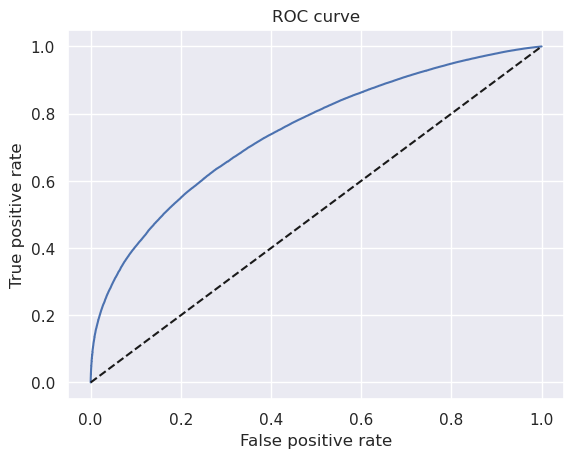

In [81]:
plt.plot(fpr, tpr)
plt.plot(fpr, fpr, linestyle = '--', color = 'k')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')

In [82]:
AUROC = roc_auc_score(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test_proba'])
AUROC

0.7448534835369012

### Gini and Kolmogorov-Smirnov

In [83]:
df_actual_predicted_probs = df_actual_predicted_probs.sort_values('y_hat_test_proba')

In [84]:
df_actual_predicted_probs.head()

,loan_data_targets_test,y_hat_test_proba,y_hat_test
232694,0,0.383476,0
1182565,1,0.384423,0
228211,1,0.393579,0
26964,0,0.398849,0
1324504,0,0.398936,0


In [85]:
df_actual_predicted_probs.tail()

,loan_data_targets_test,y_hat_test_proba,y_hat_test
1462600,1,0.999155,1
1365569,1,0.999155,1
1359624,1,0.999177,1
1431573,1,0.999225,1
1382557,1,0.999255,1


In [86]:
df_actual_predicted_probs = df_actual_predicted_probs.reset_index()

In [87]:
df_actual_predicted_probs.head()

,index,loan_data_targets_test,y_hat_test_proba,y_hat_test
0,232694,0,0.383476,0
1,1182565,1,0.384423,0
2,228211,1,0.393579,0
3,26964,0,0.398849,0
4,1324504,0,0.398936,0


In [88]:
df_actual_predicted_probs['Cumulative N Population'] = df_actual_predicted_probs.index + 1
df_actual_predicted_probs['Cumulative N Good'] = df_actual_predicted_probs['loan_data_targets_test'].cumsum()
df_actual_predicted_probs['Cumulative N Bad'] = df_actual_predicted_probs['Cumulative N Population'] - df_actual_predicted_probs['loan_data_targets_test'].cumsum()

In [89]:
df_actual_predicted_probs.head()

,index,loan_data_targets_test,y_hat_test_proba,y_hat_test,Cumulative N Population,Cumulative N Good,Cumulative N Bad
0,232694,0,0.383476,0,1,0,1
1,1182565,1,0.384423,0,2,1,1
2,228211,1,0.393579,0,3,2,1
3,26964,0,0.398849,0,4,2,2
4,1324504,0,0.398936,0,5,2,3


In [90]:
df_actual_predicted_probs['Cumulative Perc Population'] = df_actual_predicted_probs['Cumulative N Population'] / (df_actual_predicted_probs.shape[0])
df_actual_predicted_probs['Cumulative Perc Good'] = df_actual_predicted_probs['Cumulative N Good'] / df_actual_predicted_probs['loan_data_targets_test'].sum()
df_actual_predicted_probs['Cumulative Perc Bad'] = df_actual_predicted_probs['Cumulative N Bad'] / (df_actual_predicted_probs.shape[0] - df_actual_predicted_probs['loan_data_targets_test'].sum())

In [91]:
df_actual_predicted_probs.head()

,index,loan_data_targets_test,y_hat_test_proba,y_hat_test,Cumulative N Population,Cumulative N Good,Cumulative N Bad,Cumulative Perc Population,Cumulative Perc Good,Cumulative Perc Bad
0,232694,0,0.383476,0,1,0,1,0.000002,0.000000,0.000017
1,1182565,1,0.384423,0,2,1,1,0.000004,0.000003,0.000017
2,228211,1,0.393579,0,3,2,1,0.000007,0.000005,0.000017
3,26964,0,0.398849,0,4,2,2,0.000009,0.000005,0.000034
4,1324504,0,0.398936,0,5,2,3,0.000011,0.000005,0.000051


In [92]:
df_actual_predicted_probs.tail()

,index,loan_data_targets_test,y_hat_test_proba,y_hat_test,Cumulative N Population,Cumulative N Good,Cumulative N Bad,Cumulative Perc Population,Cumulative Perc Good,Cumulative Perc Bad
452136,1462600,1,0.999155,1,452137,393605,58532,0.999991,0.999990,1.0
452137,1365569,1,0.999155,1,452138,393606,58532,0.999993,0.999992,1.0
452138,1359624,1,0.999177,1,452139,393607,58532,0.999996,0.999995,1.0
452139,1431573,1,0.999225,1,452140,393608,58532,0.999998,0.999997,1.0
452140,1382557,1,0.999255,1,452141,393609,58532,1.000000,1.000000,1.0


Text(0.5, 1.0, 'Gini')

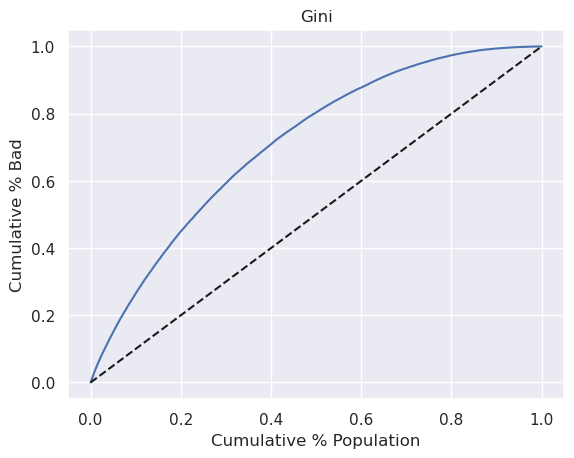

In [93]:
plt.plot(df_actual_predicted_probs['Cumulative Perc Population'], df_actual_predicted_probs['Cumulative Perc Bad'])
plt.plot(df_actual_predicted_probs['Cumulative Perc Population'], df_actual_predicted_probs['Cumulative Perc Population'], linestyle = '--', color = 'k')
plt.xlabel('Cumulative % Population')
plt.ylabel('Cumulative % Bad')
plt.title('Gini')

In [94]:
Gini = AUROC * 2 - 1
Gini

0.48970696707380235

Text(0.5, 1.0, 'Kolmogorov-Smirnov')

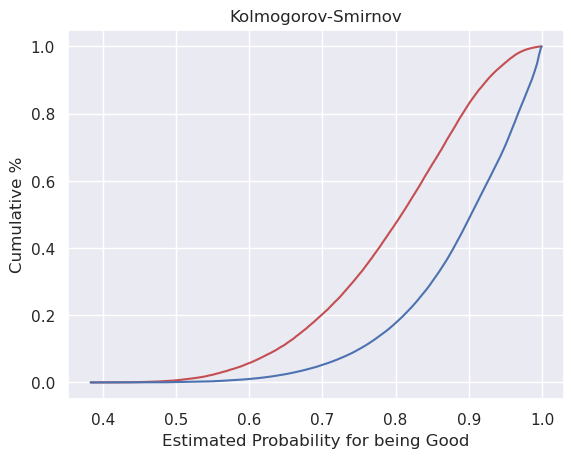

In [95]:
plt.plot(df_actual_predicted_probs['y_hat_test_proba'], df_actual_predicted_probs['Cumulative Perc Bad'], color = 'r')
plt.plot(df_actual_predicted_probs['y_hat_test_proba'], df_actual_predicted_probs['Cumulative Perc Good'], color = 'b')
plt.xlabel('Estimated Probability for being Good')
plt.ylabel('Cumulative %')
plt.title('Kolmogorov-Smirnov')

In [96]:
KS = max(df_actual_predicted_probs['Cumulative Perc Bad'] - df_actual_predicted_probs['Cumulative Perc Good'])
KS

0.3568533841105526

# Applying the PD Model

### Calculating PD of individual accounts

In [97]:
pd.options.display.max_columns = None

In [98]:
inputs_test_with_ref_cat.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,home_ownership:RENT_OTHER_NONE_ANY,home_ownership:MORTGAGE,home_ownership:OWN,addr_state:IA_AL_AR_MS_OK_LA_NV,addr_state:HI_NM_SD_FL,addr_state:MO_MD_NC_NJ_TN_IN,addr_state:PA_VA_MI_MN_KY_OH_AZ_NE,addr_state:AK_DE_UT_MA_WI_GA_RI,addr_state:IL_WY_MT,addr_state:ND_KS_WA_CT_SC_CO,addr_state:WV_DC_OR_NH_ID_VT_ME,addr_state:CA,addr_state:NY,addr_state:TX,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,purpose:educ_sm_b_ren_en_mov,purpose:debt_cons_med_other,purpose:vac_house_wed_major_purch_car_home_impr,initial_list_status:f,initial_list_status:w,term:36,term:60,emp_length:0,emp_length:1,emp_length:2-6,emp_length:7-9,emp_length:10,mths_since_issue_d:85-88,mths_since_issue_d:88-91,mths_since_issue_d:91-93,mths_since_issue_d:93-102,mths_since_issue_d:102-113,mths_since_issue_d:113-165,mths_since_issue_d:>165,int_rate:<=7.878,int_rate:7.878-11.987,int_rate:11.987-22.772,int_rate:>22.772,mths_since_earliest_cr_line:<=267,mths_since_earliest_cr_line:267-557,mths_since_earliest_cr_line:>557,inq_last_6mths:0,inq_last_6mths:1-2,inq_last_6mths:3-6,inq_last_6mths:>6,open_acc:0,open_acc:1-3,open_acc:4-12,open_acc:13-17,open_acc:18-22,open_acc:23-25,open_acc:26-30,open_acc:>=31,acc_now_delinq:0,acc_now_delinq:>=1,total_rev_hi_lim:<=5K,total_rev_hi_lim:5K-10K,total_rev_hi_lim:10K-20K,total_rev_hi_lim:20K-30K,total_rev_hi_lim:30K-40K,total_rev_hi_lim:40K-55K,total_rev_hi_lim:55K-95K,total_rev_hi_lim:>95K,annual_inc:<20K,annual_inc:20K-30K,annual_inc:30K-40K,annual_inc:40K-50K,annual_inc:50K-60K,annual_inc:60K-70K,annual_inc:70K-80K,annual_inc:80K-90K,annual_inc:90K-100K,annual_inc:100K-120K,annual_inc:120K-140K,annual_inc:>140K,dti:<=2,dti:2-4,dti:4-8,dti:8-12.4,dti:12.4-16.8,dti:16.8-21.2,dti:21.2-25.6,dti:25.6-30,dti:30-35,dti:>35,mths_since_last_delinq:Missing,mths_since_last_delinq:0-10,mths_since_last_delinq:10-30,mths_since_last_delinq:30-70,mths_since_last_delinq:>=70,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
392949,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
1273506,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
324024,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
2066630,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0
477199,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0


In [99]:
summary_table

,Feature name,Coefficients,p_values
0,Intercept,0.435466,NaN
1,grade:A,1.521062,0.000000e+00
2,grade:B,1.112401,0.000000e+00
3,grade:C,0.753321,2.416148e-177
4,grade:D,0.388298,2.019759e-48
5,grade:E,0.151061,1.297246e-09
6,grade:F,0.014016,5.652711e-01
7,home_ownership:MORTGAGE,0.247993,0.000000e+00
8,home_ownership:OWN,0.106374,8.858523e-41
9,addr_state:IA_AL_AR_MS_OK_LA_NV,-0.509384,1.416028e-176


In [100]:
y_hat_test_proba

array([0.89140006, 0.7113235 , 0.95932617, ..., 0.93894794, 0.99346413,
       0.97537443])

### Creating a Scorecard

In [101]:
summary_table

,Feature name,Coefficients,p_values
0,Intercept,0.435466,NaN
1,grade:A,1.521062,0.000000e+00
2,grade:B,1.112401,0.000000e+00
3,grade:C,0.753321,2.416148e-177
4,grade:D,0.388298,2.019759e-48
5,grade:E,0.151061,1.297246e-09
6,grade:F,0.014016,5.652711e-01
7,home_ownership:MORTGAGE,0.247993,0.000000e+00
8,home_ownership:OWN,0.106374,8.858523e-41
9,addr_state:IA_AL_AR_MS_OK_LA_NV,-0.509384,1.416028e-176


In [102]:
ref_categories

['grade:G',
 'home_ownership:RENT_OTHER_NONE_ANY',
 'addr_state:WV_DC_OR_NH_ID_VT_ME',
 'verification_status:Verified',
 'purpose:debt_cons_med_other',
 'initial_list_status:w',
 'term:60',
 'emp_length:0',
 'mths_since_issue_d:>165',
 'int_rate:>22.772',
 'mths_since_earliest_cr_line:>557',
 'inq_last_6mths:>6',
 'open_acc:>=31',
 'acc_now_delinq:>=1',
 'total_rev_hi_lim:>95K',
 'annual_inc:>140K',
 'dti:>35',
 'mths_since_last_delinq:>=70',
 'mths_since_last_record:>=86']

In [103]:
df_ref_categories = pd.DataFrame(ref_categories, columns = ['Feature name'])
df_ref_categories['Coefficients'] = 0
df_ref_categories['p_values'] = np.nan
df_ref_categories

,Feature name,Coefficients,p_values
0,grade:G,0,NaN
1,home_ownership:RENT_OTHER_NONE_ANY,0,NaN
2,addr_state:WV_DC_OR_NH_ID_VT_ME,0,NaN
3,verification_status:Verified,0,NaN
4,purpose:debt_cons_med_other,0,NaN
5,initial_list_status:w,0,NaN
6,term:60,0,NaN
7,emp_length:0,0,NaN
8,mths_since_issue_d:>165,0,NaN
9,int_rate:>22.772,0,NaN


In [104]:
df_scorecard = pd.concat([summary_table, df_ref_categories])
df_scorecard = df_scorecard.reset_index()
df_scorecard

,index,Feature name,Coefficients,p_values
0,0,Intercept,0.435466,NaN
1,1,grade:A,1.521062,0.000000e+00
2,2,grade:B,1.112401,0.000000e+00
3,3,grade:C,0.753321,2.416148e-177
4,4,grade:D,0.388298,2.019759e-48
5,5,grade:E,0.151061,1.297246e-09
6,6,grade:F,0.014016,5.652711e-01
7,7,home_ownership:MORTGAGE,0.247993,0.000000e+00
8,8,home_ownership:OWN,0.106374,8.858523e-41
9,9,addr_state:IA_AL_AR_MS_OK_LA_NV,-0.509384,1.416028e-176


In [105]:
df_scorecard['Original feature name'] = df_scorecard['Feature name'].str.split(':').str[0]

In [106]:
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name
0,0,Intercept,0.435466,NaN,Intercept
1,1,grade:A,1.521062,0.000000e+00,grade
2,2,grade:B,1.112401,0.000000e+00,grade
3,3,grade:C,0.753321,2.416148e-177,grade
4,4,grade:D,0.388298,2.019759e-48,grade
5,5,grade:E,0.151061,1.297246e-09,grade
6,6,grade:F,0.014016,5.652711e-01,grade
7,7,home_ownership:MORTGAGE,0.247993,0.000000e+00,home_ownership
8,8,home_ownership:OWN,0.106374,8.858523e-41,home_ownership
9,9,addr_state:IA_AL_AR_MS_OK_LA_NV,-0.509384,1.416028e-176,addr_state


In [107]:
min_score = 300
max_score = 850

In [108]:
df_scorecard.groupby('Original feature name')['Coefficients'].min()

Original feature name
Intercept                      0.435466
acc_now_delinq                -0.185075
addr_state                    -0.509384
annual_inc                    -0.256475
dti                           -0.075607
emp_length                     0.000000
grade                          0.000000
home_ownership                 0.000000
initial_list_status            0.000000
inq_last_6mths                 0.000000
int_rate                       0.000000
mths_since_earliest_cr_line    0.000000
mths_since_issue_d            -0.069849
mths_since_last_delinq        -0.104601
mths_since_last_record        -0.286346
open_acc                      -0.024029
purpose                       -0.185903
term                           0.000000
total_rev_hi_lim              -0.284606
verification_status            0.000000
Name: Coefficients, dtype: float64

In [109]:
min_sum_coef = df_scorecard.groupby('Original feature name')['Coefficients'].min().sum()
min_sum_coef

-1.5464097026036283

In [110]:
df_scorecard.groupby('Original feature name')['Coefficients'].max()

Original feature name
Intercept                      0.435466
acc_now_delinq                 0.000000
addr_state                     0.000000
annual_inc                     0.000000
dti                            0.212126
emp_length                     0.130069
grade                          1.521062
home_ownership                 0.247993
initial_list_status            0.020242
inq_last_6mths                 0.385454
int_rate                       0.719569
mths_since_earliest_cr_line    0.089929
mths_since_issue_d             3.090884
mths_since_last_delinq         0.000000
mths_since_last_record         0.162414
open_acc                       0.258544
purpose                        0.011574
term                           0.186578
total_rev_hi_lim               0.000000
verification_status            0.214324
Name: Coefficients, dtype: float64

In [111]:
max_sum_coef = df_scorecard.groupby('Original feature name')['Coefficients'].max().sum()
max_sum_coef

7.686227194494686

In [112]:
df_scorecard['Score - Calculation'] = df_scorecard['Coefficients'] * (max_score - min_score) / (max_sum_coef - min_sum_coef)
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation
0,0,Intercept,0.435466,NaN,Intercept,25.941240
1,1,grade:A,1.521062,0.000000e+00,grade,90.611601
2,2,grade:B,1.112401,0.000000e+00,grade,66.267131
3,3,grade:C,0.753321,2.416148e-177,grade,44.876325
4,4,grade:D,0.388298,2.019759e-48,grade,23.131439
5,5,grade:E,0.151061,1.297246e-09,grade,8.998910
6,6,grade:F,0.014016,5.652711e-01,grade,0.834965
7,7,home_ownership:MORTGAGE,0.247993,0.000000e+00,home_ownership,14.773264
8,8,home_ownership:OWN,0.106374,8.858523e-41,home_ownership,6.336809
9,9,addr_state:IA_AL_AR_MS_OK_LA_NV,-0.509384,1.416028e-176,addr_state,-30.344663


In [113]:
df_scorecard['Score - Calculation'][0] = ((df_scorecard['Coefficients'][0] - min_sum_coef) / (max_sum_coef - min_sum_coef)) * (max_score - min_score) + min_score
df_scorecard

/tmp/ipykernel_753463/1263832758.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_scorecard['Score - Calculation'][0] = ((df_scorecard['Coefficients'][0] - min_sum_coef) / (max_sum_coef - min_sum_coef)) * (max_score - min_score) + min_score


,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation
0,0,Intercept,0.435466,NaN,Intercept,418.062846
1,1,grade:A,1.521062,0.000000e+00,grade,90.611601
2,2,grade:B,1.112401,0.000000e+00,grade,66.267131
3,3,grade:C,0.753321,2.416148e-177,grade,44.876325
4,4,grade:D,0.388298,2.019759e-48,grade,23.131439
5,5,grade:E,0.151061,1.297246e-09,grade,8.998910
6,6,grade:F,0.014016,5.652711e-01,grade,0.834965
7,7,home_ownership:MORTGAGE,0.247993,0.000000e+00,home_ownership,14.773264
8,8,home_ownership:OWN,0.106374,8.858523e-41,home_ownership,6.336809
9,9,addr_state:IA_AL_AR_MS_OK_LA_NV,-0.509384,1.416028e-176,addr_state,-30.344663


In [114]:
df_scorecard['Score - Preliminary'] = df_scorecard['Score - Calculation'].round()
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation,Score - Preliminary
0,0,Intercept,0.435466,NaN,Intercept,418.062846,418.0
1,1,grade:A,1.521062,0.000000e+00,grade,90.611601,91.0
2,2,grade:B,1.112401,0.000000e+00,grade,66.267131,66.0
3,3,grade:C,0.753321,2.416148e-177,grade,44.876325,45.0
4,4,grade:D,0.388298,2.019759e-48,grade,23.131439,23.0
5,5,grade:E,0.151061,1.297246e-09,grade,8.998910,9.0
6,6,grade:F,0.014016,5.652711e-01,grade,0.834965,1.0
7,7,home_ownership:MORTGAGE,0.247993,0.000000e+00,home_ownership,14.773264,15.0
8,8,home_ownership:OWN,0.106374,8.858523e-41,home_ownership,6.336809,6.0
9,9,addr_state:IA_AL_AR_MS_OK_LA_NV,-0.509384,1.416028e-176,addr_state,-30.344663,-30.0


In [115]:
min_sum_score_prel = df_scorecard.groupby('Original feature name')['Score - Preliminary'].min().sum()
min_sum_score_prel

301.0

In [116]:
max_sum_score_prel = df_scorecard.groupby('Original feature name')['Score - Preliminary'].max(). sum()
max_sum_score_prel

851.0

In [117]:
df_scorecard['Difference'] = df_scorecard['Score - Preliminary'] - df_scorecard['Score - Calculation']
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation,Score - Preliminary,Difference
0,0,Intercept,0.435466,NaN,Intercept,418.062846,418.0,-0.062846
1,1,grade:A,1.521062,0.000000e+00,grade,90.611601,91.0,0.388399
2,2,grade:B,1.112401,0.000000e+00,grade,66.267131,66.0,-0.267131
3,3,grade:C,0.753321,2.416148e-177,grade,44.876325,45.0,0.123675
4,4,grade:D,0.388298,2.019759e-48,grade,23.131439,23.0,-0.131439
5,5,grade:E,0.151061,1.297246e-09,grade,8.998910,9.0,0.001090
6,6,grade:F,0.014016,5.652711e-01,grade,0.834965,1.0,0.165035
7,7,home_ownership:MORTGAGE,0.247993,0.000000e+00,home_ownership,14.773264,15.0,0.226736
8,8,home_ownership:OWN,0.106374,8.858523e-41,home_ownership,6.336809,6.0,-0.336809
9,9,addr_state:IA_AL_AR_MS_OK_LA_NV,-0.509384,1.416028e-176,addr_state,-30.344663,-30.0,0.344663


In [118]:
df_scorecard['Score - Final'] = df_scorecard['Score - Preliminary']
df_scorecard['Score - Final'][0] = 417.0
df_scorecard

/tmp/ipykernel_753463/1739642479.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_scorecard['Score - Final'][0] = 417.0


,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation,Score - Preliminary,Difference,Score - Final
0,0,Intercept,0.435466,NaN,Intercept,418.062846,418.0,-0.062846,417.0
1,1,grade:A,1.521062,0.000000e+00,grade,90.611601,91.0,0.388399,91.0
2,2,grade:B,1.112401,0.000000e+00,grade,66.267131,66.0,-0.267131,66.0
3,3,grade:C,0.753321,2.416148e-177,grade,44.876325,45.0,0.123675,45.0
4,4,grade:D,0.388298,2.019759e-48,grade,23.131439,23.0,-0.131439,23.0
5,5,grade:E,0.151061,1.297246e-09,grade,8.998910,9.0,0.001090,9.0
6,6,grade:F,0.014016,5.652711e-01,grade,0.834965,1.0,0.165035,1.0
7,7,home_ownership:MORTGAGE,0.247993,0.000000e+00,home_ownership,14.773264,15.0,0.226736,15.0
8,8,home_ownership:OWN,0.106374,8.858523e-41,home_ownership,6.336809,6.0,-0.336809,6.0
9,9,addr_state:IA_AL_AR_MS_OK_LA_NV,-0.509384,1.416028e-176,addr_state,-30.344663,-30.0,0.344663,-30.0


In [119]:
min_sum_score_prel = df_scorecard.groupby('Original feature name')['Score - Final'].min().sum()
min_sum_score_prel

300.0

In [120]:
max_sum_score_prel = df_scorecard.groupby('Original feature name')['Score - Final'].max(). sum()
max_sum_score_prel

850.0

### Caclulating Credit Score

In [121]:
inputs_test_with_ref_cat.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,home_ownership:RENT_OTHER_NONE_ANY,home_ownership:MORTGAGE,home_ownership:OWN,addr_state:IA_AL_AR_MS_OK_LA_NV,addr_state:HI_NM_SD_FL,addr_state:MO_MD_NC_NJ_TN_IN,addr_state:PA_VA_MI_MN_KY_OH_AZ_NE,addr_state:AK_DE_UT_MA_WI_GA_RI,addr_state:IL_WY_MT,addr_state:ND_KS_WA_CT_SC_CO,addr_state:WV_DC_OR_NH_ID_VT_ME,addr_state:CA,addr_state:NY,addr_state:TX,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,purpose:educ_sm_b_ren_en_mov,purpose:debt_cons_med_other,purpose:vac_house_wed_major_purch_car_home_impr,initial_list_status:f,initial_list_status:w,term:36,term:60,emp_length:0,emp_length:1,emp_length:2-6,emp_length:7-9,emp_length:10,mths_since_issue_d:85-88,mths_since_issue_d:88-91,mths_since_issue_d:91-93,mths_since_issue_d:93-102,mths_since_issue_d:102-113,mths_since_issue_d:113-165,mths_since_issue_d:>165,int_rate:<=7.878,int_rate:7.878-11.987,int_rate:11.987-22.772,int_rate:>22.772,mths_since_earliest_cr_line:<=267,mths_since_earliest_cr_line:267-557,mths_since_earliest_cr_line:>557,inq_last_6mths:0,inq_last_6mths:1-2,inq_last_6mths:3-6,inq_last_6mths:>6,open_acc:0,open_acc:1-3,open_acc:4-12,open_acc:13-17,open_acc:18-22,open_acc:23-25,open_acc:26-30,open_acc:>=31,acc_now_delinq:0,acc_now_delinq:>=1,total_rev_hi_lim:<=5K,total_rev_hi_lim:5K-10K,total_rev_hi_lim:10K-20K,total_rev_hi_lim:20K-30K,total_rev_hi_lim:30K-40K,total_rev_hi_lim:40K-55K,total_rev_hi_lim:55K-95K,total_rev_hi_lim:>95K,annual_inc:<20K,annual_inc:20K-30K,annual_inc:30K-40K,annual_inc:40K-50K,annual_inc:50K-60K,annual_inc:60K-70K,annual_inc:70K-80K,annual_inc:80K-90K,annual_inc:90K-100K,annual_inc:100K-120K,annual_inc:120K-140K,annual_inc:>140K,dti:<=2,dti:2-4,dti:4-8,dti:8-12.4,dti:12.4-16.8,dti:16.8-21.2,dti:21.2-25.6,dti:25.6-30,dti:30-35,dti:>35,mths_since_last_delinq:Missing,mths_since_last_delinq:0-10,mths_since_last_delinq:10-30,mths_since_last_delinq:30-70,mths_since_last_delinq:>=70,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
392949,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
1273506,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
324024,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
2066630,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0
477199,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0


In [122]:
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation,Score - Preliminary,Difference,Score - Final
0,0,Intercept,0.435466,NaN,Intercept,418.062846,418.0,-0.062846,417.0
1,1,grade:A,1.521062,0.000000e+00,grade,90.611601,91.0,0.388399,91.0
2,2,grade:B,1.112401,0.000000e+00,grade,66.267131,66.0,-0.267131,66.0
3,3,grade:C,0.753321,2.416148e-177,grade,44.876325,45.0,0.123675,45.0
4,4,grade:D,0.388298,2.019759e-48,grade,23.131439,23.0,-0.131439,23.0
5,5,grade:E,0.151061,1.297246e-09,grade,8.998910,9.0,0.001090,9.0
6,6,grade:F,0.014016,5.652711e-01,grade,0.834965,1.0,0.165035,1.0
7,7,home_ownership:MORTGAGE,0.247993,0.000000e+00,home_ownership,14.773264,15.0,0.226736,15.0
8,8,home_ownership:OWN,0.106374,8.858523e-41,home_ownership,6.336809,6.0,-0.336809,6.0
9,9,addr_state:IA_AL_AR_MS_OK_LA_NV,-0.509384,1.416028e-176,addr_state,-30.344663,-30.0,0.344663,-30.0


In [123]:
inputs_test_with_ref_cat_w_intercept = inputs_test_with_ref_cat

In [124]:
inputs_test_with_ref_cat_w_intercept.insert(0, 'Intercept', 1)

In [125]:
inputs_test_with_ref_cat_w_intercept.head()

,Intercept,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,home_ownership:RENT_OTHER_NONE_ANY,home_ownership:MORTGAGE,home_ownership:OWN,addr_state:IA_AL_AR_MS_OK_LA_NV,addr_state:HI_NM_SD_FL,addr_state:MO_MD_NC_NJ_TN_IN,addr_state:PA_VA_MI_MN_KY_OH_AZ_NE,addr_state:AK_DE_UT_MA_WI_GA_RI,addr_state:IL_WY_MT,addr_state:ND_KS_WA_CT_SC_CO,addr_state:WV_DC_OR_NH_ID_VT_ME,addr_state:CA,addr_state:NY,addr_state:TX,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,purpose:educ_sm_b_ren_en_mov,purpose:debt_cons_med_other,purpose:vac_house_wed_major_purch_car_home_impr,initial_list_status:f,initial_list_status:w,term:36,term:60,emp_length:0,emp_length:1,emp_length:2-6,emp_length:7-9,emp_length:10,mths_since_issue_d:85-88,mths_since_issue_d:88-91,mths_since_issue_d:91-93,mths_since_issue_d:93-102,mths_since_issue_d:102-113,mths_since_issue_d:113-165,mths_since_issue_d:>165,int_rate:<=7.878,int_rate:7.878-11.987,int_rate:11.987-22.772,int_rate:>22.772,mths_since_earliest_cr_line:<=267,mths_since_earliest_cr_line:267-557,mths_since_earliest_cr_line:>557,inq_last_6mths:0,inq_last_6mths:1-2,inq_last_6mths:3-6,inq_last_6mths:>6,open_acc:0,open_acc:1-3,open_acc:4-12,open_acc:13-17,open_acc:18-22,open_acc:23-25,open_acc:26-30,open_acc:>=31,acc_now_delinq:0,acc_now_delinq:>=1,total_rev_hi_lim:<=5K,total_rev_hi_lim:5K-10K,total_rev_hi_lim:10K-20K,total_rev_hi_lim:20K-30K,total_rev_hi_lim:30K-40K,total_rev_hi_lim:40K-55K,total_rev_hi_lim:55K-95K,total_rev_hi_lim:>95K,annual_inc:<20K,annual_inc:20K-30K,annual_inc:30K-40K,annual_inc:40K-50K,annual_inc:50K-60K,annual_inc:60K-70K,annual_inc:70K-80K,annual_inc:80K-90K,annual_inc:90K-100K,annual_inc:100K-120K,annual_inc:120K-140K,annual_inc:>140K,dti:<=2,dti:2-4,dti:4-8,dti:8-12.4,dti:12.4-16.8,dti:16.8-21.2,dti:21.2-25.6,dti:25.6-30,dti:30-35,dti:>35,mths_since_last_delinq:Missing,mths_since_last_delinq:0-10,mths_since_last_delinq:10-30,mths_since_last_delinq:30-70,mths_since_last_delinq:>=70,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
392949,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
1273506,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
324024,1,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
2066630,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0
477199,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0


In [126]:
inputs_test_with_ref_cat_w_intercept = inputs_test_with_ref_cat_w_intercept[df_scorecard['Feature name'].values]

In [127]:
inputs_test_with_ref_cat_w_intercept.head()

,Intercept,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:MORTGAGE,home_ownership:OWN,addr_state:IA_AL_AR_MS_OK_LA_NV,addr_state:HI_NM_SD_FL,addr_state:MO_MD_NC_NJ_TN_IN,addr_state:PA_VA_MI_MN_KY_OH_AZ_NE,addr_state:AK_DE_UT_MA_WI_GA_RI,addr_state:IL_WY_MT,addr_state:ND_KS_WA_CT_SC_CO,addr_state:CA,addr_state:NY,addr_state:TX,verification_status:Not Verified,verification_status:Source Verified,purpose:educ_sm_b_ren_en_mov,purpose:vac_house_wed_major_purch_car_home_impr,initial_list_status:f,term:36,emp_length:1,emp_length:2-6,emp_length:7-9,emp_length:10,mths_since_issue_d:85-88,mths_since_issue_d:88-91,mths_since_issue_d:91-93,mths_since_issue_d:93-102,mths_since_issue_d:102-113,mths_since_issue_d:113-165,int_rate:<=7.878,int_rate:7.878-11.987,int_rate:11.987-22.772,mths_since_earliest_cr_line:<=267,mths_since_earliest_cr_line:267-557,inq_last_6mths:0,inq_last_6mths:1-2,inq_last_6mths:3-6,open_acc:0,open_acc:1-3,open_acc:4-12,open_acc:13-17,open_acc:18-22,open_acc:23-25,open_acc:26-30,acc_now_delinq:0,total_rev_hi_lim:<=5K,total_rev_hi_lim:5K-10K,total_rev_hi_lim:10K-20K,total_rev_hi_lim:20K-30K,total_rev_hi_lim:30K-40K,total_rev_hi_lim:40K-55K,total_rev_hi_lim:55K-95K,annual_inc:<20K,annual_inc:20K-30K,annual_inc:30K-40K,annual_inc:40K-50K,annual_inc:50K-60K,annual_inc:60K-70K,annual_inc:70K-80K,annual_inc:80K-90K,annual_inc:90K-100K,annual_inc:100K-120K,annual_inc:120K-140K,dti:<=2,dti:2-4,dti:4-8,dti:8-12.4,dti:12.4-16.8,dti:16.8-21.2,dti:21.2-25.6,dti:25.6-30,dti:30-35,mths_since_last_delinq:Missing,mths_since_last_delinq:0-10,mths_since_last_delinq:10-30,mths_since_last_delinq:30-70,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,grade:G,home_ownership:RENT_OTHER_NONE_ANY,addr_state:WV_DC_OR_NH_ID_VT_ME,verification_status:Verified,purpose:debt_cons_med_other,initial_list_status:w,term:60,emp_length:0,mths_since_issue_d:>165,int_rate:>22.772,mths_since_earliest_cr_line:>557,inq_last_6mths:>6,open_acc:>=31,acc_now_delinq:>=1,total_rev_hi_lim:>95K,annual_inc:>140K,dti:>35,mths_since_last_delinq:>=70,mths_since_last_record:>=86
392949,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0
1273506,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1
324024,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
2066630,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
477199,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,1,1,1,0,0,1,0,0,0,0,1,0,1,0,0


In [128]:
scorecard_scores = df_scorecard['Score - Final']

In [129]:
inputs_test_with_ref_cat_w_intercept.shape

(452141, 107)

In [130]:
scorecard_scores.shape

(107,)

In [131]:
scorecard_scores = scorecard_scores.values.reshape(107, 1)

In [132]:
scorecard_scores.shape

(107, 1)

In [133]:
y_scores = inputs_test_with_ref_cat_w_intercept.dot(scorecard_scores)

In [134]:
y_scores.head()

,0
392949,517.0
1273506,444.0
324024,579.0
2066630,566.0
477199,469.0


In [135]:
y_scores.tail()

,0
1205942,413.0
860827,703.0
267134,554.0
867240,691.0
1123633,612.0


### From Credit Score to PD

In [136]:
sum_coef_from_score = ((y_scores - min_score) / (max_score - min_score)) * (max_sum_coef - min_sum_coef) + min_sum_coef

In [137]:
y_hat_proba_from_score = np.exp(sum_coef_from_score) / (np.exp(sum_coef_from_score) + 1)
y_hat_proba_from_score.head()

,0
392949,0.890542
1273506,0.704925
324024,0.958396
2066630,0.948769
477199,0.784237


In [138]:
y_hat_test_proba[0: 5]

array([0.89140006, 0.7113235 , 0.95932617, 0.94980974, 0.78660319])

### Setting Cut-offs

In [139]:
tr = 0.9
df_actual_predicted_probs['y_hat_test'] = np.where(df_actual_predicted_probs['y_hat_test_proba'] > tr, 1, 0)

In [140]:
pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted'])

Predicted,0,1
Actual,,
0,48537,9995
1,191669,201940


In [141]:
pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]

Predicted,0,1
Actual,,
0,0.107349,0.022106
1,0.423914,0.446631


In [142]:
(pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]).iloc[0, 0] + (pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]).iloc[1, 1]

0.5539798425712333

In [143]:
from sklearn.metrics import roc_curve, roc_auc_score

In [144]:
roc_curve(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test_proba'])

(array([0.        , 0.        , 0.        , ..., 0.99998292, 0.99998292,
        1.        ]),
 array([0.00000000e+00, 2.54059231e-06, 4.75090763e-04, ...,
        9.99994919e-01, 1.00000000e+00, 1.00000000e+00]),
 array([       inf, 0.99925519, 0.99882637, ..., 0.39884932, 0.38442267,
        0.38347551]))

In [145]:
fpr, tpr, thresholds = roc_curve(df_actual_predicted_probs['loan_data_targets_test'],
                                 df_actual_predicted_probs['y_hat_test_proba'])

In [146]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

Text(0.5, 1.0, 'ROC curve')

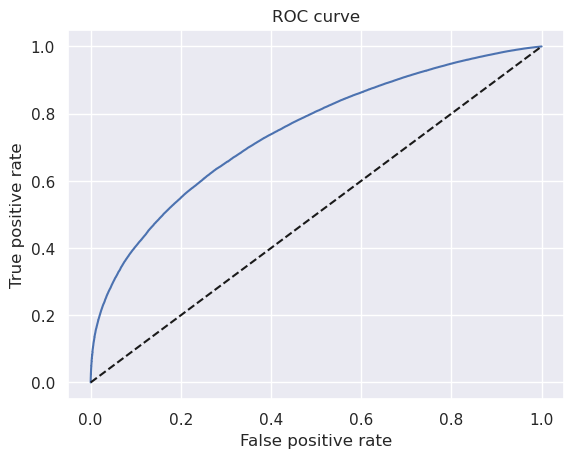

In [147]:
plt.plot(fpr, tpr)
plt.plot(fpr, fpr, linestyle = '--', color = 'k')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')

In [148]:
thresholds

array([       inf, 0.99925519, 0.99882637, ..., 0.39884932, 0.38442267,
       0.38347551])

In [149]:
thresholds.shape

(95057,)

In [150]:
df_cutoffs = pd.concat([pd.DataFrame(thresholds), pd.DataFrame(fpr), pd.DataFrame(tpr)], axis = 1)

In [151]:
df_cutoffs.columns = ['thresholds', 'fpr', 'tpr']

In [152]:
df_cutoffs.head()

,thresholds,fpr,tpr
0,inf,0.0,0.000000
1,0.999255,0.0,0.000003
2,0.998826,0.0,0.000475
3,0.998826,0.0,0.000480
4,0.998731,0.0,0.000805


In [153]:
df_cutoffs['thresholds'][0] = 1 - 1 / np.power(10, 16)

In [154]:
df_cutoffs['Score'] = ((np.log(df_cutoffs['thresholds'] / (1 - df_cutoffs['thresholds'])) - min_sum_coef) * ((max_score - min_score) / (max_sum_coef - min_sum_coef)) + min_score).round()

In [155]:
df_cutoffs.head()

,thresholds,fpr,tpr,Score
0,1.000000,0.0,0.000000,2581.0
1,0.999255,0.0,0.000003,821.0
2,0.998826,0.0,0.000475,794.0
3,0.998826,0.0,0.000480,794.0
4,0.998731,0.0,0.000805,789.0


In [156]:
df_cutoffs['Score'][0] = max_score

In [157]:
df_cutoffs.head()

,thresholds,fpr,tpr,Score
0,1.000000,0.0,0.000000,850.0
1,0.999255,0.0,0.000003,821.0
2,0.998826,0.0,0.000475,794.0
3,0.998826,0.0,0.000480,794.0
4,0.998731,0.0,0.000805,789.0


In [158]:
df_cutoffs.tail()

,thresholds,fpr,tpr,Score
95052,0.406639,0.999932,0.999987,370.0
95053,0.402978,0.999932,0.999995,369.0
95054,0.398849,0.999983,0.999995,368.0
95055,0.384423,0.999983,1.000000,364.0
95056,0.383476,1.000000,1.000000,364.0


In [159]:
def n_approved(p):
    return np.where(df_actual_predicted_probs['y_hat_test_proba'] >= p, 1, 0).sum()

In [160]:
df_cutoffs['N Approved'] = df_cutoffs['thresholds'].apply(n_approved)
df_cutoffs['N Rejected'] = df_actual_predicted_probs['y_hat_test_proba'].shape[0] - df_cutoffs['N Approved']
df_cutoffs['Approval Rate'] = df_cutoffs['N Approved'] / df_actual_predicted_probs['y_hat_test_proba'].shape[0]
df_cutoffs['Rejection Rate'] = 1 - df_cutoffs['Approval Rate']

In [161]:
df_cutoffs.head()

,thresholds,fpr,tpr,Score,N Approved,N Rejected,Approval Rate,Rejection Rate
0,1.000000,0.0,0.000000,850.0,0,452141,0.000000,1.000000
1,0.999255,0.0,0.000003,821.0,1,452140,0.000002,0.999998
2,0.998826,0.0,0.000475,794.0,187,451954,0.000414,0.999586
3,0.998826,0.0,0.000480,794.0,189,451952,0.000418,0.999582
4,0.998731,0.0,0.000805,789.0,317,451824,0.000701,0.999299


In [162]:
df_cutoffs.tail()

,thresholds,fpr,tpr,Score,N Approved,N Rejected,Approval Rate,Rejection Rate
95052,0.406639,0.999932,0.999987,370.0,452132,9,0.999980,0.000020
95053,0.402978,0.999932,0.999995,369.0,452135,6,0.999987,0.000013
95054,0.398849,0.999983,0.999995,368.0,452138,3,0.999993,0.000007
95055,0.384423,0.999983,1.000000,364.0,452140,1,0.999998,0.000002
95056,0.383476,1.000000,1.000000,364.0,452141,0,1.000000,0.000000


In [164]:
df_cutoffs.iloc[16000: 17000, ]

,thresholds,fpr,tpr,Score,N Approved,N Rejected,Approval Rate,Rejection Rate
16000,0.911106,0.136626,0.464664,531.0,190893,261248,0.422198,0.577802
16001,0.911096,0.136626,0.464705,531.0,190909,261232,0.422233,0.577767
16002,0.911092,0.136643,0.464705,531.0,190910,261231,0.422236,0.577764
16003,0.911091,0.136643,0.464707,531.0,190911,261230,0.422238,0.577762
16004,0.911091,0.136660,0.464707,531.0,190912,261229,0.422240,0.577760
16005,0.911084,0.136660,0.464738,531.0,190924,261217,0.422267,0.577733
16006,0.911084,0.136677,0.464738,531.0,190925,261216,0.422269,0.577731
16007,0.911049,0.136677,0.464908,531.0,190992,261149,0.422417,0.577583
16008,0.911048,0.136712,0.464908,531.0,190994,261147,0.422421,0.577579
16009,0.911047,0.136712,0.464918,531.0,190998,261143,0.422430,0.577570


In [ ]:
df_cutoffs.iloc[1000: 2000, ]

In [165]:
inputs_train_with_ref_cat.to_csv('inputs_train_with_ref_cat.csv')

In [166]:
df_scorecard.to_csv('df_scorecard.csv')